<a href="https://colab.research.google.com/github/gazal-gupta/Deep_Learning/blob/master/Project_2_v_0_2_Music_Genre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Statement

Music Genre Identification 
Download data from here : https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz

Goal : Given audio files for songs , identify which genre they fall in

Suggested Guidelines :

You'll have to prepare and maintain your own version of train and validation from the full data given

Major challenge here is to create features from audio files which can then be passed to your choice of deep learning algorithm

Your solution needs to be uploaded on GitHub repo of your team

Download data from the dropbox link

In [0]:
!wget https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz

--2020-01-12 09:00:46--  https://www.dropbox.com/s/4jw31k5mlzcmgis/genres.tar.gz
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.1, 2620:100:601b:1::a27d:801
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/4jw31k5mlzcmgis/genres.tar.gz [following]
--2020-01-12 09:00:46--  https://www.dropbox.com/s/raw/4jw31k5mlzcmgis/genres.tar.gz
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uce444fb99aa020d6aed87d9feb2.dl.dropboxusercontent.com/cd/0/inline/AwCXbyDMNLoeo9ZEl8i80tm02_rBjnn3jdrSwS71KBooMvCKEwaSYj2JfMoLqWogkYD3gRdzL7CpNWXNUpe1LzRdzYzH59WJhE_5lcaZcMHRcQ/file# [following]
--2020-01-12 09:00:47--  https://uce444fb99aa020d6aed87d9feb2.dl.dropboxusercontent.com/cd/0/inline/AwCXbyDMNLoeo9ZEl8i80tm02_rBjnn3jdrSwS71KBooMvCKEwaSYj2JfMoLqWogkYD3gRdzL7CpNWXNUpe1LzRdzYzH59WJhE_5lcaZcMHRcQ/file
Resolving uce444

In [0]:
#unzip 
import tarfile

my_tar = tarfile.open('/content/genres.tar.gz')
my_tar.extractall('./Genres_Extract') # specify which folder to extract to
my_tar.close()


Links for reference
https://towardsdatascience.com/extract-features-of-music-75a3f9bc265d


Here we are using Librosa package for analyzing and extracting features of an audio signal. For playing audio we will using 'pyAudio' package so that we can play music on jupyter directly.

Loading an audio

In [0]:
import librosa
audio_path = '/content/Genres_Extract/genres/blues/blues.00000.au' #single audio file

x , sr = librosa.load(audio_path) #.load loads an audio file and decodes it into a 1-dimensional array which is a time series x
                                  # sr is a sampling rate of x
print(type(x), x.shape)
print(type(sr), sr)

<class 'numpy.ndarray'> (661794,)
<class 'int'> 22050


![MFCC Feature Extraction](https://https://miro.medium.com/max/850/1*kLLpD8FvzOcMmuxf4cT0Pw.png)

.load loads an audio file and decodes it into a 1-dimensional array which is a time series x , and sr is a sampling rate of x . Default sris 22kHz. We can override the 'sr' by 44100. sr value is taken as refrence from the blog

In [0]:
librosa.load(audio_path, sr=44100)

(array([ 0.00735559,  0.01335777,  0.01657013, ..., -0.07286715,
        -0.0628456 , -0.03154328], dtype=float32), 44100)

In [0]:
#disable sampling 
librosa.load(audio_path, sr=None)

(array([ 0.00732422,  0.01660156,  0.00762939, ..., -0.05560303,
        -0.06106567, -0.06417847], dtype=float32), 22050)

Playing an audio

In [0]:
import IPython.display as ipd
audio_path = '/content/Genres_Extract/genres/classical/classical.00000.au' #single audio file
ipd.Audio(audio_path) # load a local WAV file

import numpy
sr = 44100 # sample rate
T = 2.0    # seconds
t = numpy.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*numpy.sin(2*numpy.pi*440*t)                # pure sine wave at 440 Hz

ipd.Audio(x, rate=sr) # load a NumPy array

Refer for the plot : https://musicinformationretrieval.com/ipython_audio.html

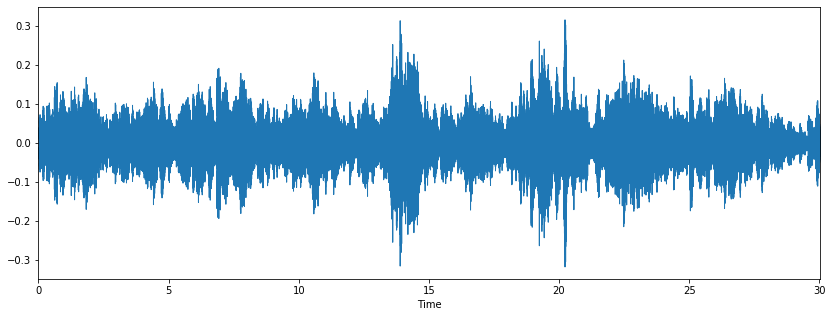

In [0]:
#display waveform plot by using librosa.display.waveplot between
# amplitude vs time where the first axis is an amplitude and second axis is time
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

Below Spectogram shows different frequencies playing at a particular time along with it’s amplitude. Amplitude and frequency are important parameters of the sound and are unique for each audio.

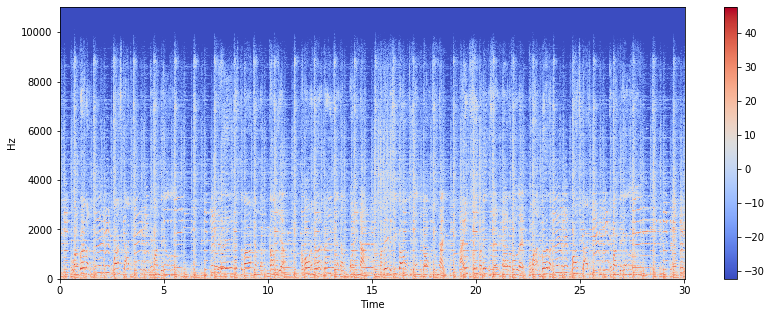

In [0]:
#display Spectrogram
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='Time(ms)', y_axis='Hertz(Hz)') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

Feature Extraction
Zero Crossing Rate: The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. 

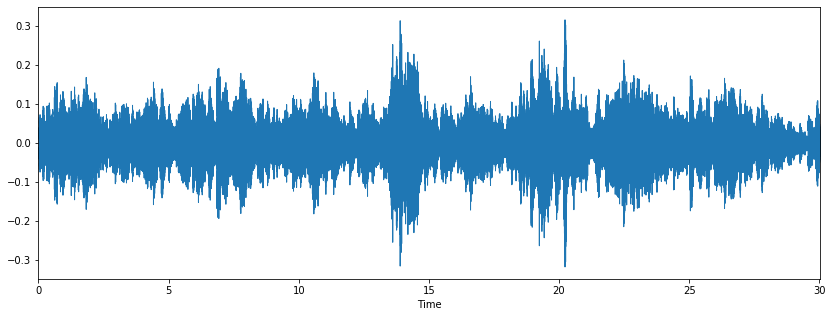

In [0]:
x, sr = librosa.load(audio_path)
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

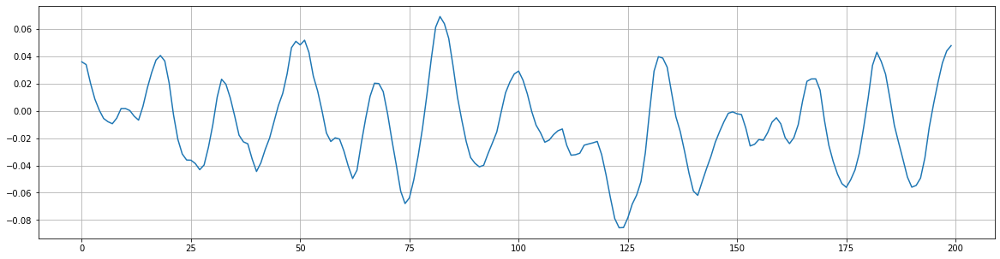

In [0]:
# Zooming in or print spectrum for 200 array columns
n0 = 8000
n1 = 8200
plt.figure(figsize=(20, 5))
plt.plot(x[n0:n1])
plt.grid()

In [0]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

22


Spectral Centroid : It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. 

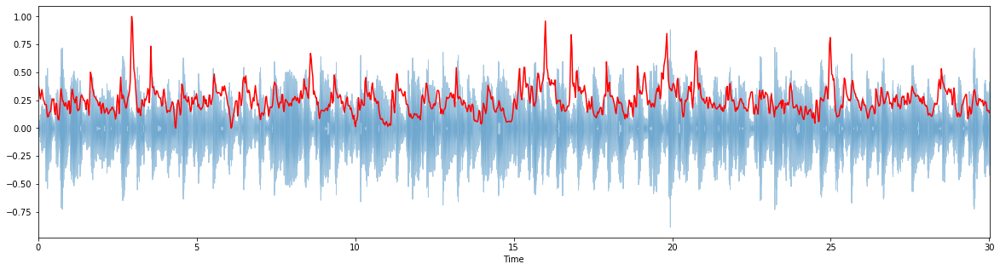

In [0]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
from sklearn.preprocessing import minmax_scale
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform

plt.figure(figsize=(20, 5))
librosa.display.waveplot(x, sr=sr, alpha=0.4)

plt.plot(t, normalize(spectral_centroids), color='r')

Spectral Rolloff
Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

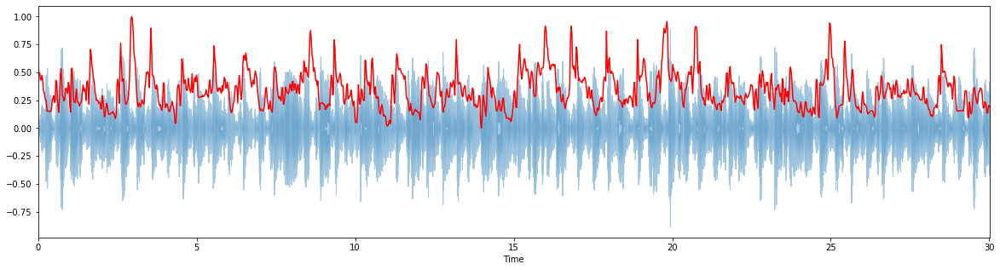

In [0]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)[0]

plt.figure(figsize=(20, 5))

librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

MFCC — Mel-Frequency Cepstral Coefficients
This feature is one of the most important method to extract a feature of an audio signal and is used majorly whenever working on audio signals. The mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope.

(20, 1293)


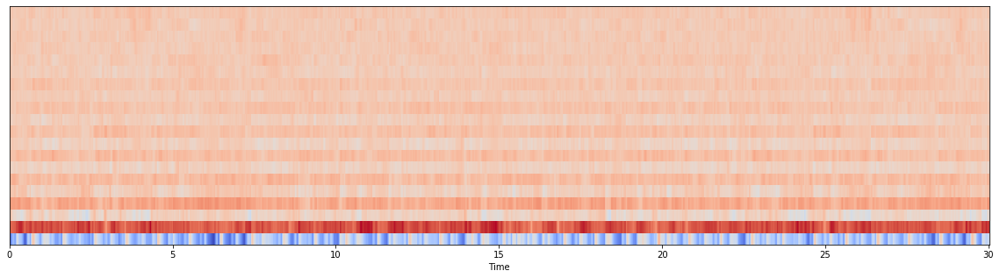

In [0]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

#Displaying  the MFCCs:
plt.figure(figsize=(20, 5))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

#The first value represents the number of mfccs calculated and second value represents the number of frames available.

#Classification of Music into different Genres using Keras

Using the above algorithm together will all extract all the audio files from the given genre

In [0]:
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import csv

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

import keras
from keras.layers import LSTM,GRU, Activation, Dense, Dropout,Flatten, Input, Embedding
from keras.models import Model
from keras.models import Sequential
from keras import models
from keras import layers
from keras import backend as K
from keras.layers import BatchNormalization

In [0]:
pip install --ignore-installed --upgrade https://storage.googleapis.com/tensorflow/mac/cpu/tensorflow-1.6.0-py3-none-any.whl

     |████████████████████████████████| 43.2MB 73kB/s 
     |████████████████████████████████| 3.1MB 4.9MB/s 
     |████████████████████████████████| 1.3MB 55.8MB/s 
     |████████████████████████████████| 112kB 76.0MB/s 
     |████████████████████████████████| 2.4MB 43.2MB/s 
     |████████████████████████████████| 20.2MB 162kB/s 
     |████████████████████████████████| 890kB 54.1MB/s 
     |████████████████████████████████| 92kB 14.7MB/s 
     |████████████████████████████████| 327kB 65.7MB/s 
     |████████████████████████████████| 593kB 76.8MB/s 
  Created wheel for gast: filename=gast-0.3.2-cp36-none-any.whl size=9679 sha256=8e787ce9f2619f9e97888e565c5240aeda0b89af456ef7b7d7483c00913e73cb
  Stored in directory: /root/.cache/pip/wheels/59/38/c6/234dc39b4f6951a0768fbc02d5b7207137a5b1d9094f0d54bf
  Created wheel for absl-py: filename=absl_py-0.9.0-cp36-none-any.whl size=121931 sha256=48fbf66168eba4b1a034af50ff8d209f51aefd70f7ddf00d1e0d9987e7e46c9c
  Stored in directory: /root/.cache/

Creating Dataset
We’ll process dataset as per our requirements. We’ll create a CSV file with the data we required.

In [0]:
header = 'filename chroma_stft rmse spectral_centroid spectral_bandwidth rolloff zero_crossing_rate'
for i in range(1, 21):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

Converting all the music files for each genere similarly as above and then storing into a csv file. Total music audio consists of 10 genres and each genre consist of 100 music clips each is 30 seconds long.

In [0]:
file = open('Music_Genre.csv', 'w', newline='')#opening a new csv file
with file:
    writer = csv.writer(file) #opening the csv in write mode
    writer.writerow(header) # writing the header names
#genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split() #all the give genre
genres = ['blues' ,'classical', 'country', 'disco' ,'hiphop', 'jazz' ,'metal', 'pop', 'reggae', 'rock']#all the give genre

In [0]:
for g in genres:
    for filename in os.listdir(f'/content/Genres_Extract/genres/{g}'):
        songname = f'/content/Genres_Extract/genres/{g}/{filename}'
        
        y, sr = librosa.load(songname, mono=True, duration=30)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        rmse = librosa.feature.rmse(y=y)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)}'    
        
        for m in mfcc:
            to_append += f' {np.mean(m)}'
        to_append += f' {g}'
        file = open('Music_Genre.csv', 'a', newline='') #appending the data into csv file
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

---------------------------------------------------------------------------------------------------
# Preprocessing Dataset

In [0]:
data = pd.read_csv('/content/Music_Genre.csv') #loading the csv file in which music feature are extracted
print('Shape of Data : ' , data.shape)
data.head()

Shape of Data :  (1000, 28)


,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,blues.00005.au,0.302346,0.103468,1831.942368,1729.483241,3480.937285,0.094040,-177.869048,118.196916,-17.550673,30.758635,-21.742746,11.903802,-20.734249,3.180597,-8.583484,-0.936488,-11.776273,-2.420615,-9.339365,-9.939325,-3.909892,-5.570625,-1.839023,-2.778421,-3.046866,-8.115809,blues
1,blues.00050.au,0.400860,0.182380,1945.848425,2082.246626,4175.874749,0.085806,-82.979023,107.052113,-25.320453,57.124995,0.085439,34.696804,-11.042022,20.532698,-11.213178,14.834126,-10.229334,12.539582,-9.762304,2.562253,-6.300853,2.996785,-8.718456,-0.326581,-2.980347,0.712601,blues
2,blues.00040.au,0.397725,0.134892,2272.495079,2356.855937,5108.319111,0.097657,-110.260079,90.701812,-2.527487,74.053272,-11.747301,39.214671,-13.171819,20.535274,-17.163641,12.828713,-21.433580,5.952405,-8.033586,4.239868,-16.485552,6.542503,-5.695943,-3.640864,-4.856884,1.854516,blues
3,blues.00057.au,0.424284,0.175920,1886.683619,1913.224623,3828.101852,0.089924,-92.747981,115.339527,-35.064272,57.861557,1.845091,26.616611,-14.552453,22.133255,-8.209146,11.015951,-5.643600,7.277174,-10.205973,1.332175,-4.105897,0.978302,-6.553787,-0.682512,-2.126826,-1.518243,blues
4,blues.00089.au,0.348553,0.052862,798.266186,1285.201240,1453.882875,0.025640,-347.016941,139.270482,24.174419,22.193823,18.695712,11.665297,9.036069,6.951593,-2.015199,5.426169,1.675913,-2.349583,3.197295,0.688728,-3.091588,-2.107179,-2.213318,-4.577963,-4.726823,0.066003,blues


Each audio file get 20 mfcc for given sampling rate because it is calculated for each frame so mfcc has 20 columns.
All the features using librosa package and has created a dataset with the Music_Genre.csv file name and has inserted all the feature values of given music in given headers.

In [0]:
data.describe()

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.378669,0.130929,2201.834226,2242.559613,4571.702159,0.103637,-144.479173,99.552199,-8.921949,36.293063,-1.146627,14.634083,-5.129624,10.119876,-6.995752,7.730251,-6.021121,4.471604,-4.797232,1.781547,-3.870275,1.147988,-3.967431,0.507303,-2.328779,-1.094875
std,0.081706,0.065685,715.961347,526.337663,1574.770035,0.041834,100.235661,31.331904,21.695015,16.666987,12.222555,11.840802,9.941638,10.464090,8.284181,7.937977,6.819018,6.717312,6.170919,5.009489,4.874423,4.579110,4.550650,3.869088,3.755574,3.837561
min,0.171782,0.005276,569.930721,897.994319,749.062137,0.021701,-552.064063,-1.527148,-89.901142,-18.768461,-38.903451,-28.424546,-32.933588,-24.947537,-31.653059,-12.051190,-28.052265,-15.805227,-27.542309,-12.598773,-17.545474,-15.693589,-17.227765,-11.975698,-18.504188,-19.935203
25%,0.319641,0.086625,1627.793931,1907.136505,3380.956639,0.070281,-200.695133,76.811480,-24.223791,24.107395,-9.974552,5.097782,-12.870050,1.609752,-13.249849,1.621692,-10.966826,-0.551576,-9.363372,-1.640080,-7.164838,-1.857098,-7.194297,-2.003979,-4.670281,-3.368000
50%,0.383075,0.122448,2209.468780,2221.408983,4658.671829,0.099539,-120.206072,98.452551,-10.716073,36.957074,-0.015239,15.007553,-5.717005,9.663922,-7.512299,7.151456,-5.920161,3.891842,-4.199810,1.879424,-3.614473,1.211944,-4.059109,0.669788,-2.391261,-1.155198
75%,0.435974,0.175793,2691.969702,2578.474352,5534.197785,0.132007,-73.895019,119.893638,5.505793,48.212826,7.920911,23.857726,2.974185,18.708671,-0.383367,14.399350,-1.004241,9.706133,-0.161017,5.155264,-0.323536,4.350694,-0.842968,3.112518,0.149070,1.303739
max,0.663573,0.398012,4434.439444,3509.578677,8676.405868,0.274829,42.034587,193.096518,56.666090,80.691273,31.461661,45.173178,21.835769,49.018887,19.129207,27.216746,17.421038,23.037571,13.054333,18.161663,12.357588,13.468803,11.489994,15.379257,14.686910,15.368966


In [0]:
data.dtypes

filename               object
chroma_stft           float64
rmse                  float64
spectral_centroid     float64
spectral_bandwidth    float64
rolloff               float64
zero_crossing_rate    float64
mfcc1                 float64
mfcc2                 float64
mfcc3                 float64
mfcc4                 float64
mfcc5                 float64
mfcc6                 float64
mfcc7                 float64
mfcc8                 float64
mfcc9                 float64
mfcc10                float64
mfcc11                float64
mfcc12                float64
mfcc13                float64
mfcc14                float64
mfcc15                float64
mfcc16                float64
mfcc17                float64
mfcc18                float64
mfcc19                float64
mfcc20                float64
label                  object
dtype: object

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import missingno as mso

In [0]:
all_data_na = (data.isnull().sum() / len(data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(20)

,Missing Ratio


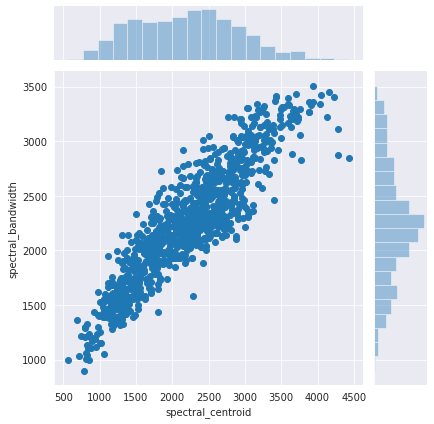

In [0]:
sns.jointplot(x="spectral_centroid", y="spectral_bandwidth", data=data)
# scatterplot is default kind of plot shown by the jointplot() function

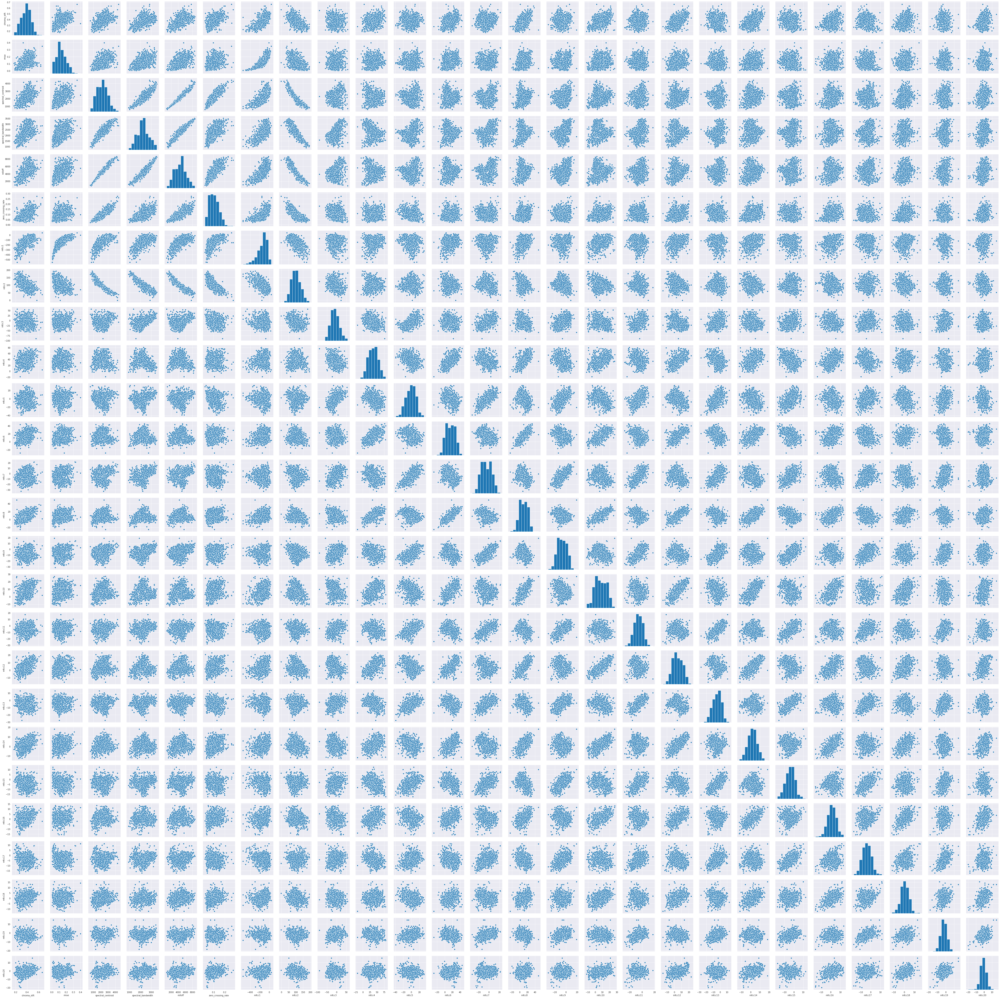

In [0]:
sns.pairplot(data)

In [0]:
# Dropping unneccesary columns
data = data.drop(['filename'],axis=1) # dropping file name column as its no needed
data.head()

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,0.302346,0.103468,1831.942368,1729.483241,3480.937285,0.094040,-177.869048,118.196916,-17.550673,30.758635,-21.742746,11.903802,-20.734249,3.180597,-8.583484,-0.936488,-11.776273,-2.420615,-9.339365,-9.939325,-3.909892,-5.570625,-1.839023,-2.778421,-3.046866,-8.115809,blues
1,0.400860,0.182380,1945.848425,2082.246626,4175.874749,0.085806,-82.979023,107.052113,-25.320453,57.124995,0.085439,34.696804,-11.042022,20.532698,-11.213178,14.834126,-10.229334,12.539582,-9.762304,2.562253,-6.300853,2.996785,-8.718456,-0.326581,-2.980347,0.712601,blues
2,0.397725,0.134892,2272.495079,2356.855937,5108.319111,0.097657,-110.260079,90.701812,-2.527487,74.053272,-11.747301,39.214671,-13.171819,20.535274,-17.163641,12.828713,-21.433580,5.952405,-8.033586,4.239868,-16.485552,6.542503,-5.695943,-3.640864,-4.856884,1.854516,blues
3,0.424284,0.175920,1886.683619,1913.224623,3828.101852,0.089924,-92.747981,115.339527,-35.064272,57.861557,1.845091,26.616611,-14.552453,22.133255,-8.209146,11.015951,-5.643600,7.277174,-10.205973,1.332175,-4.105897,0.978302,-6.553787,-0.682512,-2.126826,-1.518243,blues
4,0.348553,0.052862,798.266186,1285.201240,1453.882875,0.025640,-347.016941,139.270482,24.174419,22.193823,18.695712,11.665297,9.036069,6.951593,-2.015199,5.426169,1.675913,-2.349583,3.197295,0.688728,-3.091588,-2.107179,-2.213318,-4.577963,-4.726823,0.066003,blues


In [0]:
genre_list = data.iloc[:, -1] #selecting the last column i.e 'lable' with all rows
encoder = LabelEncoder() #to convert all the genre labels into nominal data
Y = encoder.fit_transform(genre_list) # actual transformation of the label column
print(Y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 

In [0]:
# Normalizing the dataset by Standard Scaler( subtract by mean and then divide by std dev)
# We can also use MinMax Scaler
scaler = StandardScaler()
X_data = np.array(data.iloc[:, :-1], dtype = float) # converting the scaler value into float number to maintain the precision
X = scaler.fit_transform(X_data)
print(X)

[[-0.93457874 -0.41827932 -0.51689514 ... -0.84964916 -0.19130131
  -1.83044581]
 [ 0.27173311  0.78369181 -0.35772027 ... -0.21563247 -0.17358042
   0.47123147]
 [ 0.23334508  0.06036556  0.09874305 ... -1.07266667 -0.67349738
   0.76894327]
 ...
 [ 0.20191101 -0.24696078  0.12914718 ...  1.18817542 -1.96183401
  -0.74777174]
 [-0.19983701 -0.71651359 -1.12235633 ...  0.2717664  -0.72311185
  -0.64936228]
 [-0.26853768 -0.36647431  0.53093448 ...  1.86222309 -0.60725602
   0.42312626]]


In [0]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

In [0]:
input_shape = (X_train.shape[1],)
input_shape

(26,)

Model creating, training and testing . 
Creating a Model

In [0]:
model = Sequential()
model.add(layers.Dense(256, activation='relu', input_shape = input_shape))
model.add(Dropout(0.25))
model.add(BatchNormalization())
model.add(layers.Dense(128, activation='relu'))
model.add(Dropout(0.25))
model.add(BatchNormalization())
model.add(layers.Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(layers.Dense(10, activation='softmax'))

Learning Process of a model

In [0]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

#Loss function sparse_categorical_crossentropy is similar to categorical_crossentropy 
#just used when we have multiple classification fields.

In [62]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 256)               6912      
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_3 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 128)               512       
_________________________________________________________________
dense_4 (Dense)              (None, 64)               

In [0]:
from keras.callbacks import ModelCheckpoint
import os
outputFolder = './content/Model_output/'
if not os.path.exists(outputFolder):
    os.makedirs(outputFolder)
filepath = outputFolder+"/weights-{epoch:02d}-{val_acc:.4f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_best_only=False, save_weights_only=True, 
                             mode='auto', period=1)
# this will save the weights every 10 epoch

from keras.callbacks import EarlyStopping
earlystop = EarlyStopping(monitor='val_acc', min_delta=0.0001, patience=3,
                          verbose=1, mode='auto')

In [0]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
class my_custom_callback(keras.callbacks.Callback):
    # There sre multiple actions that you can take at various stages of modeling fitting process
    # Those functions are commented out right now, but if you want you can add actions
    # I have added a auc score calcualtion at every epoch's end
    def on_train_begin(self, logs={}):
        self.aucs = []
        self.losses = []


    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))
        y_pred = self.model.predict(self.validation_data[0])
        self.aucs.append(roc_auc_score(self.validation_data[1], y_pred))
        print('auc score for validation data :',self.aucs[-1])
        return
mycallback=my_custom_callback()

In [74]:
model.fit(X_train, Y_train, epochs=200, batch_size=128,callbacks=[earlystop] )

Epoch 1/200
800/800 [==============================] - 0s 60us/step - loss: 0.1781 - acc: 0.9337
Epoch 2/200
800/800 [==============================] - 0s 57us/step - loss: 0.2629 - acc: 0.9062
Epoch 3/200
800/800 [==============================] - 0s 56us/step - loss: 0.2391 - acc: 0.9163
Epoch 4/200
800/800 [==============================] - 0s 49us/step - loss: 0.2146 - acc: 0.9337
Epoch 5/200
800/800 [==============================] - 0s 54us/step - loss: 0.2223 - acc: 0.9237
Epoch 6/200
128/800 [===>..........................] - ETA: 0s - loss: 0.1801 - acc: 0.9297

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:842: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: loss,acc
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


800/800 [==============================] - 0s 64us/step - loss: 0.1888 - acc: 0.9425
Epoch 7/200
800/800 [==============================] - 0s 58us/step - loss: 0.2342 - acc: 0.9387
Epoch 8/200
800/800 [==============================] - 0s 54us/step - loss: 0.2278 - acc: 0.9375
Epoch 9/200
800/800 [==============================] - 0s 56us/step - loss: 0.2072 - acc: 0.9288
Epoch 10/200
800/800 [==============================] - 0s 51us/step - loss: 0.2230 - acc: 0.9325
Epoch 11/200
800/800 [==============================] - 0s 60us/step - loss: 0.1780 - acc: 0.9337
Epoch 12/200
800/800 [==============================] - 0s 64us/step - loss: 0.1859 - acc: 0.9375
Epoch 13/200
800/800 [==============================] - 0s 63us/step - loss: 0.1717 - acc: 0.9413
Epoch 14/200
800/800 [==============================] - 0s 55us/step - loss: 0.1591 - acc: 0.9537
Epoch 15/200
800/800 [==============================] - 0s 55us/step - loss: 0.1930 - acc: 0.9263
Epoch 16/200
800/800 [==============

Evaluate the model

In [75]:
loss_test, acc_test = model.evaluate(X_test, Y_test)
print('Accuracy on Test data: ', acc_test)
print('Loss on Test data:' ,loss_test )

200/200 [==============================] - 0s 108us/step
Accuracy on Test data:  0.67
Loss on Test data: 1.882517204284668


Prediction

In [76]:
predictions = model.predict(X_test)
np.argmax(predictions[0])

9

In [77]:
predictions

array([[1.29463342e-05, 3.93466557e-08, 4.74509113e-02, ...,
        1.97323789e-06, 5.63247158e-05, 9.52445567e-01],
       [1.21749595e-01, 3.04876667e-05, 8.84914538e-04, ...,
        2.29833950e-03, 7.60250270e-01, 5.45183138e-04],
       [3.69349273e-10, 1.00000000e+00, 1.51907743e-13, ...,
        7.71918879e-14, 3.43396326e-15, 4.21900706e-19],
       ...,
       [2.30986261e-04, 8.18807725e-03, 2.67717801e-02, ...,
        9.11242896e-05, 8.81004962e-04, 1.91307423e-04],
       [1.00000000e+00, 7.11040622e-15, 3.19033605e-10, ...,
        2.92222619e-15, 7.91567441e-13, 1.88630604e-08],
       [3.67482733e-09, 5.38939171e-10, 3.30457794e-09, ...,
        8.71269151e-07, 9.99834895e-01, 9.64209246e-09]], dtype=float32)

In [79]:
submission_data = pd.DataFrame(predictions,columns=['blues','classical','country','disco',
                                                    'hiphop','jazz','metal','pop','reggae','rock'])
submission_data

,blues,classical,country,disco,hiphop,jazz,metal,pop,reggae,rock
0,1.294633e-05,3.934666e-08,4.745091e-02,2.200755e-05,1.566364e-09,1.008819e-05,1.896111e-07,1.973238e-06,5.632472e-05,9.524456e-01
1,1.217496e-01,3.048767e-05,8.849145e-04,1.195715e-04,1.136308e-01,4.009136e-04,8.989361e-05,2.298340e-03,7.602503e-01,5.451831e-04
2,3.693493e-10,1.000000e+00,1.519077e-13,7.902520e-13,8.553837e-14,1.364113e-08,8.506070e-14,7.719189e-14,3.433963e-15,4.219007e-19
3,2.372713e-04,1.758329e-06,7.463561e-05,5.005463e-03,1.323489e-04,1.144627e-06,9.811153e-01,6.539932e-07,4.210958e-06,1.342710e-02
4,4.112212e-08,1.141657e-07,1.241100e-07,1.390128e-03,9.984887e-01,1.203515e-07,1.071794e-04,1.261989e-06,9.615590e-06,2.778482e-06
...,...,...,...,...,...,...,...,...,...,...
195,8.207862e-01,1.628863e-04,1.660055e-01,2.485321e-03,5.481254e-04,8.803567e-05,4.200804e-04,1.343905e-04,4.360919e-03,5.008428e-03
196,3.165690e-03,1.869379e-08,4.366429e-08,2.980446e-07,4.752433e-06,1.171886e-10,9.968275e-01,1.372317e-10,3.255530e-08,1.582935e-06
197,2.309863e-04,8.188077e-03,2.677178e-02,1.664531e-03,8.103625e-05,9.618919e-01,8.210310e-06,9.112429e-05,8.810050e-04,1.913074e-04
198,1.000000e+00,7.110406e-15,3.190336e-10,1.801612e-12,6.025558e-13,2.200543e-14,1.619870e-10,2.922226e-15,7.915674e-13,1.886306e-08


In [0]:
submission_data.to_csv('Project 2_Music Genre.csv',index= False)